In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import torch
import scipy
from scipy.special import gamma, loggamma

In [2]:
# Beta params functions

def beta_distr_mean(alpha, beta):
    # assert (alpha>=0)
    # assert (beta>=0)
    return alpha/(alpha+beta)

def beta_reparameterize_mean_precision(alpha, beta):
    mean = alpha/(alpha+beta)
    precision = alpha+beta
    return mean, precision

def beta_distr_var(alpha, beta):
    # assert (alpha>=0)
    # assert (beta>=0)
    return (alpha*beta)/((alpha+beta)**2 * (alpha+beta+1))

def get_alpha(mean, variance):
    if isinstance(mean, list):
        mean = np.array(mean)
    if isinstance(variance, list):
        variance = np.array(variance)
    
    return ((1-mean)/variance - 1/mean) * (mean**2)

def get_beta(mean, alpha):
    if isinstance(mean, list):
        mean = np.array(mean)
    if isinstance(alpha, list):
        alpha = np.array(alpha)
    return alpha * (1/mean -1)


def get_mode(alpha, beta):
    if alpha>1 and beta>1:
        mode = (alpha-1)/(alpha+beta-2)
    elif alpha<=1 and beta>1:
        mode = 0
    elif alpha>1 and beta<=1:
        mode = 1
    else:
        raise ValueError("Invalid Alpha-Beta params, no unique mode")
    return mode


In [34]:
def beta_distr_params_from_alpha_beta(alpha, beta):
    mean = alpha/(alpha+beta)
    precision = alpha+beta
    variance = (alpha*beta)/((alpha+beta)**2 * (alpha+beta+1))
    
    mode = None
    if alpha>1 and beta>1:
        mode = (alpha-1)/(alpha+beta-2)
    elif alpha<=1 and beta>1:
        mode = 0
    elif alpha>1 and beta<=1:
        mode = 1
        
    return mean, precision, variance, mode


def beta_distr_params_from_mean_precision(mean, precision):
    alpha = mean * precision
    beta = precision - alpha
    
    variance = mean*(1-mean)/(1+precision)
    
    mode = 1#None
    # if alpha>1 and beta>1:
    #     mode = (alpha-1)/(alpha+beta-2)
    # elif alpha<=1 and beta>1:
    #     mode = 0
    # elif alpha>1 and beta<=1:
    #     mode = 1
        
    return alpha, beta, variance, mode

In [4]:
mean, precision, variance, mode = beta_distr_params_from_alpha_beta(37, 819)
print(mean, precision, variance, mode)

0.04322429906542056 856 4.825666165195291e-05 0.04215456674473068


In [5]:
beta_distr_params_from_mean_precision(mean, precision)

(37.0, 819.0, 4.825666165195291e-05, 0.04215456674473068)

# KL Divergence

In [6]:
def beta_kl_divergence(alpha1, beta1, alpha2, beta2):
    if isinstance(alpha1, (list, np.ndarray)):
        alpha1 = torch.tensor(alpha1)
    if isinstance(beta1, (list, np.ndarray)):
        beta1 = torch.tensor(beta1)
    if isinstance(alpha2, (list, np.ndarray)):
        alpha2 = torch.tensor(alpha2)
    if isinstance(beta2, (list, np.ndarray)):
        beta2 = torch.tensor(beta2)
    
    
    assert (alpha1<0).sum()==0, "Invalid alpha1"
    assert (beta1<0).sum()==0, "Invalid beta1"
    assert (alpha2<0).sum()==0, "Invalid alpha2"
    assert (beta2<0).sum()==0, "Invalid beta2"
    
    kl_div = (torch.lgamma(alpha1+beta1) - torch.lgamma(alpha2+beta2)
              - (torch.lgamma(alpha1) + torch.lgamma(beta1))
              + (torch.lgamma(alpha2) + torch.lgamma(beta2))
              + (alpha1 - alpha2) * (torch.digamma(alpha1) - torch.digamma(alpha1+beta1))
              + (beta1 - beta2) * (torch.digamma(beta1) - torch.digamma(alpha1+beta1))
             )
    return kl_div

beta_kl_divergence([1], [2], [3], [4])

tensor([0.5988])

# Symmetrized log likelihood

In [7]:
from scipy.special import gamma
import plotly.graph_objects as go
import pandas as pd
import numpy as np

In [8]:
def beta_likelihood(y, mu, phi):
    norm = gamma(phi)/(gamma(mu*phi)*gamma((1-mu)*phi))
    ll = np.power(y, (mu*phi)-1) * np.power((1-y), (1-mu)*phi - 1)
    return ll*norm

In [9]:
def simmetrized_likelihood(mu1, phi1, mu2, phi2):
    sl = beta_likelihood(mu1, mu2, phi2) + beta_likelihood(mu2, mu1, phi1)
    return sl

In [10]:
test_point = (0.7, 4)



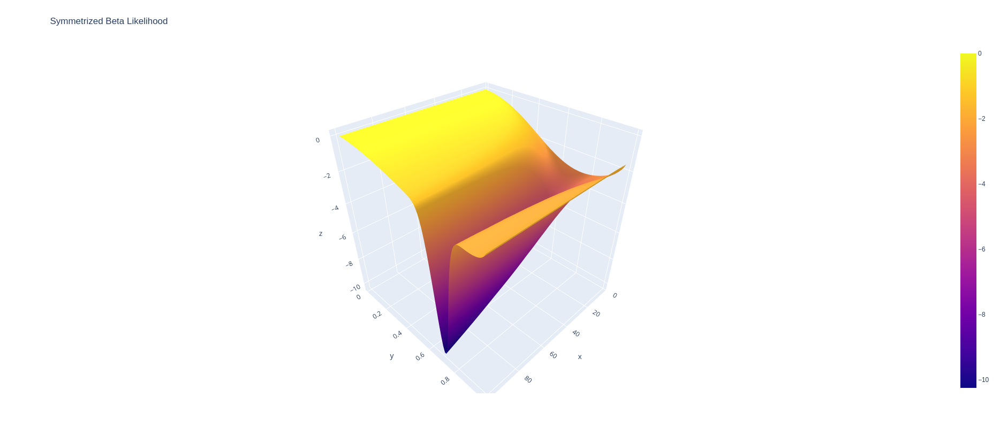

In [11]:
mus = np.linspace(0.01, 0.99, 100)
phis = np.linspace(3, 100, 100)

zvals = np.zeros((len(mus), len(phis)))

for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        zvals[i, j] = -1 * simmetrized_likelihood(test_point[0], test_point[1], mu, phi)


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals, x=phis, y=mus)])
fig.update_layout(title='Symmetrized Beta Likelihood', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

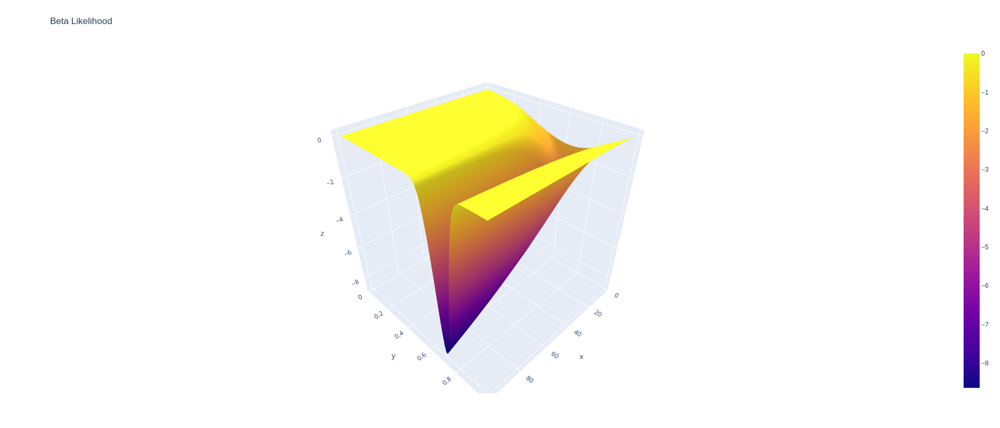

In [12]:

zvals2 = np.zeros((len(mus), len(phis)))

for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        zvals2[i, j] = -1 * beta_likelihood(test_point[0], mu, phi)


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals2, x=phis, y=mus)])
fig.update_layout(title='Beta Likelihood', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

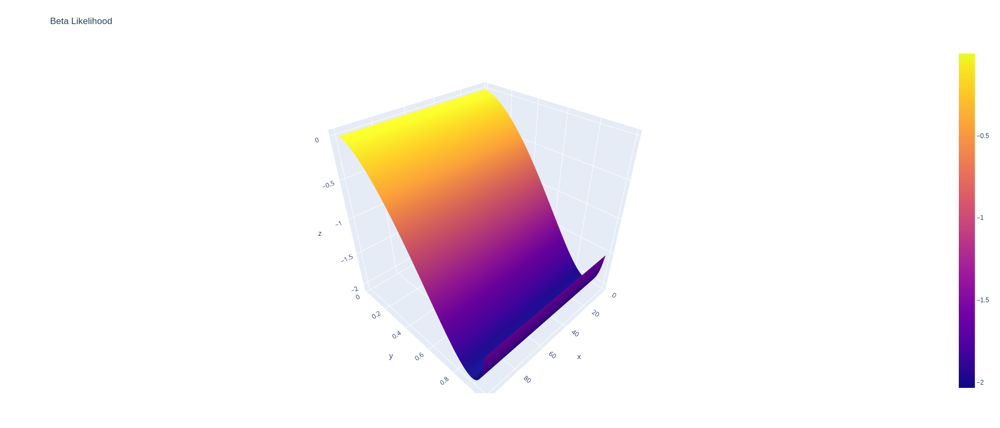

In [13]:

zvals3 = np.zeros((len(mus), len(phis)))

for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        zvals3[i, j] = -1 * beta_likelihood(mu, test_point[0], test_point[1])


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals3, x=phis, y=mus)])
fig.update_layout(title='Beta Likelihood', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

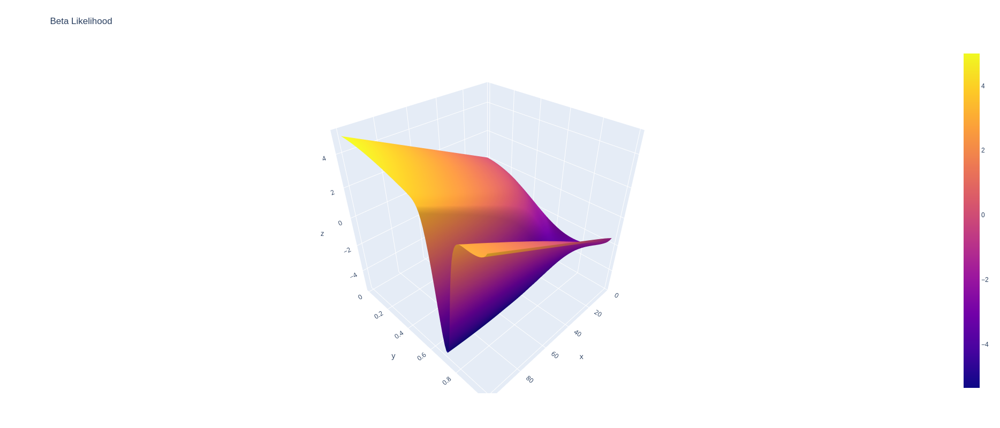

In [14]:

zvals4 = np.zeros((len(mus), len(phis)))

for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        zvals4[i, j] = -1 * simmetrized_likelihood(test_point[0], test_point[1], mu, phi) + 0.05 * np.abs(phi)


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals4, x=phis, y=mus)])
fig.update_layout(title='Beta Likelihood', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

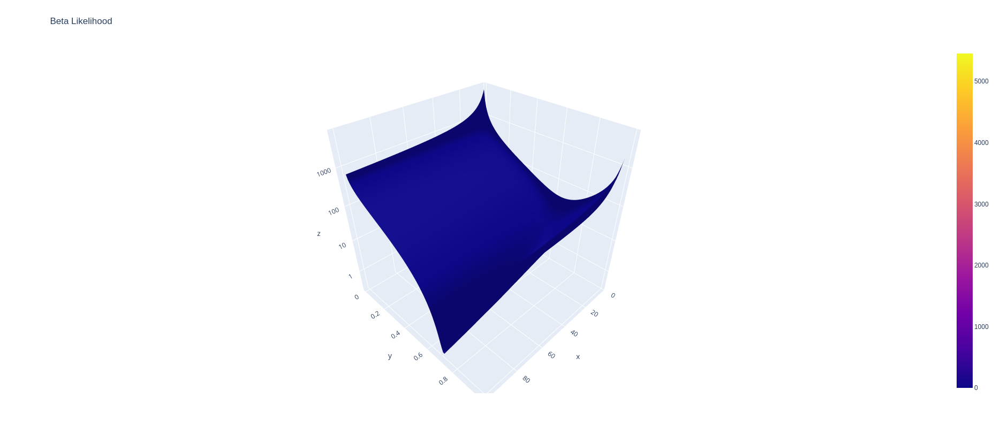

In [15]:
test_point = [0.7, 230]

zvals5 = np.zeros((len(mus), len(phis)))

test_alpha, test_beta, test_var, test_mode = beta_distr_params_from_mean_precision(*test_point)
for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        alpha, beta, var, mode = beta_distr_params_from_mean_precision(mu, phi)
        zvals5[i, j] = beta_kl_divergence([alpha], [beta], [test_alpha], [test_beta])  + 0.0005 * np.abs(phi)


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals5, x=phis, y=mus)])
fig.update_layout(title='Beta Likelihood', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.update_layout(scene=dict(zaxis=dict(dtick=1, type='log')))
fig.show()

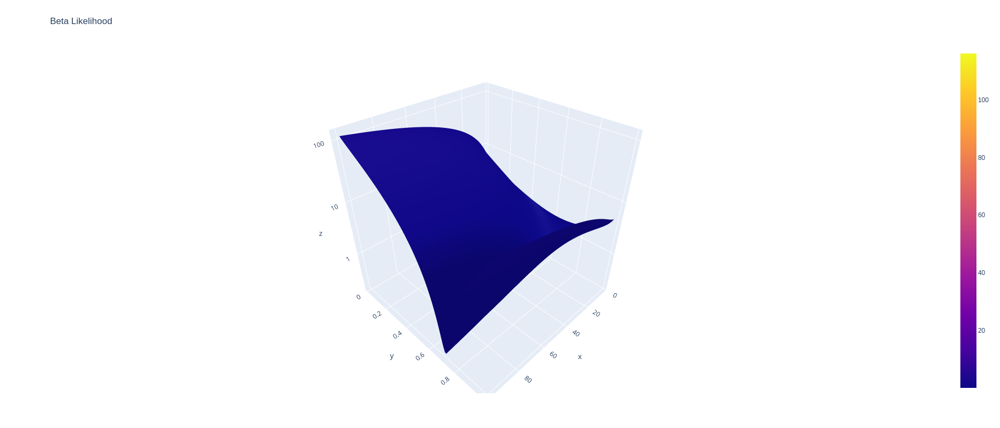

In [16]:

zvals5 = np.zeros((len(mus), len(phis)))

test_alpha, test_beta, test_var, test_mode = beta_distr_params_from_mean_precision(*test_point)
for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        alpha, beta, var, mode = beta_distr_params_from_mean_precision(mu, phi)
        zvals5[i, j] = beta_kl_divergence( [test_alpha], [test_beta], [alpha], [beta])  + 0.0005 * np.abs(phi)


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals5, x=phis, y=mus)])
fig.update_layout(title='Beta Likelihood', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.update_layout(scene=dict(zaxis=dict(dtick=1, type='log')))
fig.show()

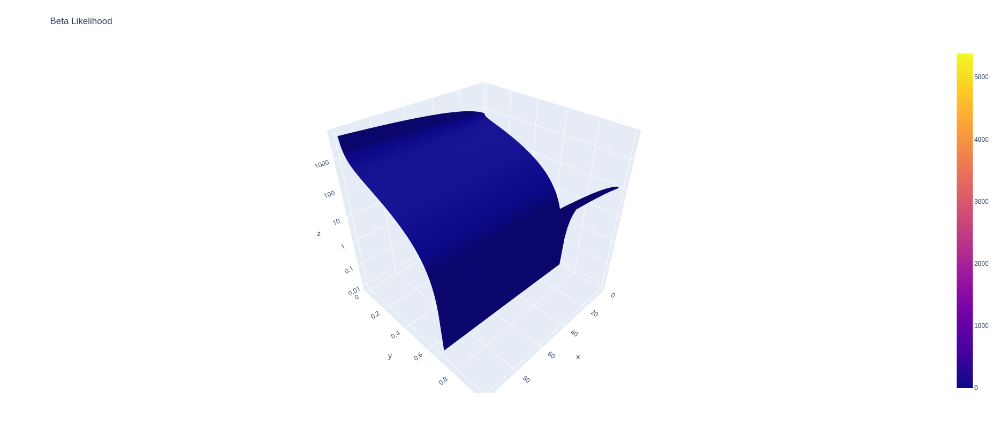

In [17]:
test_point = [0.7, 230]
zvals6 = np.zeros((len(mus), len(phis)))
test_alpha, test_beta, test_var, test_mode = beta_distr_params_from_mean_precision(*test_point)

for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        alpha, beta, var, mode = beta_distr_params_from_mean_precision(mu, phi)
        zvals6[i, j] = (test_point[0]-mu)**2/var +  (test_point[0]-mu)**2/test_var
        


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals6, x=phis, y=mus)])
fig.update_layout(title='Beta Likelihood', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.update_layout(scene=dict(zaxis=dict(dtick=1, type='log')))
fig.show()

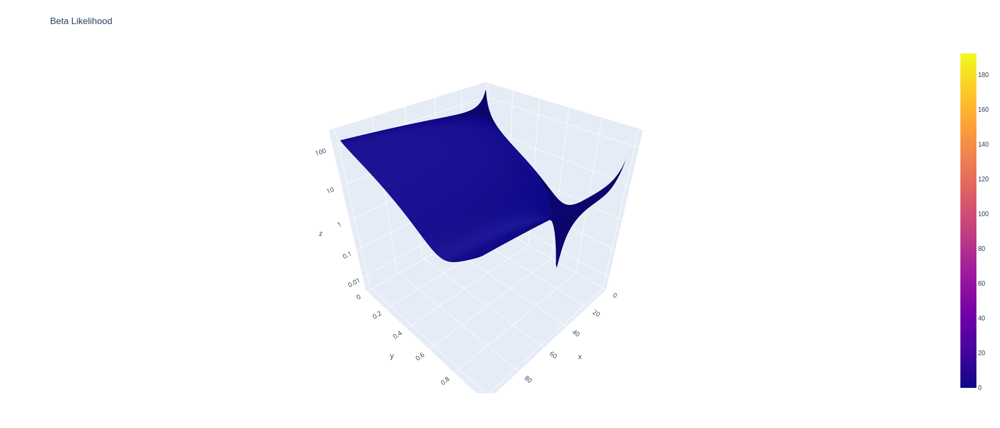

In [18]:
test_point = [0.7, 8]

zvals5 = np.zeros((len(mus), len(phis)))

test_alpha, test_beta, test_var, test_mode = beta_distr_params_from_mean_precision(*test_point)
for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        alpha, beta, var, mode = beta_distr_params_from_mean_precision(mu, phi)
        zvals5[i, j] = beta_kl_divergence([alpha], [beta], [test_alpha], [test_beta]) + beta_kl_divergence([test_alpha], [test_beta], [alpha], [beta]) + 0.0005 * np.abs(phi)


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals5, x=phis, y=mus)])
fig.update_layout(title='Beta Likelihood', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.update_layout(scene=dict(zaxis=dict(dtick=1, type='log')))
fig.show()

In [19]:
def beta_chernoff_distance(alpha1, beta1, alpha2, beta2, lbd=0.5):
    assert lbd>0 and lbd<1
    if isinstance(alpha1, (int, float)):
        alpha1 = torch.tensor([alpha1])
    if isinstance(beta1, (int, float)):
        beta1 = torch.tensor([beta1])
    if isinstance(alpha2, (int, float)):
        alpha2 = torch.tensor([alpha2])
    if isinstance(beta2, (int, float)):
        beta2 = torch.tensor([beta2])
    
    
    if isinstance(alpha1, (list, np.ndarray)):
        alpha1 = torch.tensor(alpha1)
    if isinstance(beta1, (list, np.ndarray)):
        beta1 = torch.tensor(beta1)
    if isinstance(alpha2, (list, np.ndarray)):
        alpha2 = torch.tensor(alpha2)
    if isinstance(beta2, (list, np.ndarray)):
        beta2 = torch.tensor(beta2)
    
    
    assert (alpha1<0).sum()==0, "Invalid alpha1"
    assert (beta1<0).sum()==0, "Invalid beta1"
    assert (alpha2<0).sum()==0, "Invalid alpha2"
    assert (beta2<0).sum()==0, "Invalid beta2"

    jc = (torch.lgamma(lbd*alpha1+(1-lbd)*alpha2 + lbd*beta1+(1-lbd)*beta2)
          + lbd * (torch.lgamma(alpha1)+torch.lgamma(beta1)) 
          + (1-lbd) * (torch.lgamma(alpha2)+torch.lgamma(beta2))
          - torch.lgamma(lbd*alpha1 + (1-lbd)*alpha2) - torch.lgamma(lbd*beta1 + (1-lbd)*beta2)
          - lbd * torch.lgamma(alpha1+beta1)
          - (1-lbd) * torch.lgamma(alpha2 + beta2)
         )
    return jc

In [20]:
beta_chernoff_distance(10, 4, 30, 4)

tensor([0.4929])

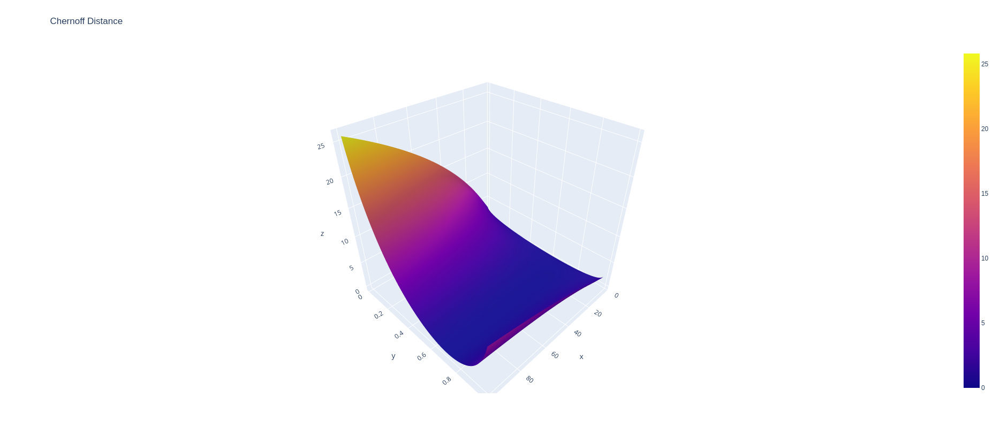

In [21]:
test_point = [0.7, 58]

zvals5 = np.zeros((len(mus), len(phis)))

test_alpha, test_beta, test_var, test_mode = beta_distr_params_from_mean_precision(*test_point)
for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        alpha, beta, var, mode = beta_distr_params_from_mean_precision(mu, phi)
        zvals5[i, j] = beta_chernoff_distance(test_alpha, test_beta, alpha, beta, lbd=0.5).item()


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals5, x=phis, y=mus)])
fig.update_layout(title='Chernoff Distance', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
# fig.update_layout(scene=dict(zaxis=dict(dtick=1, type='log')))
fig.show()

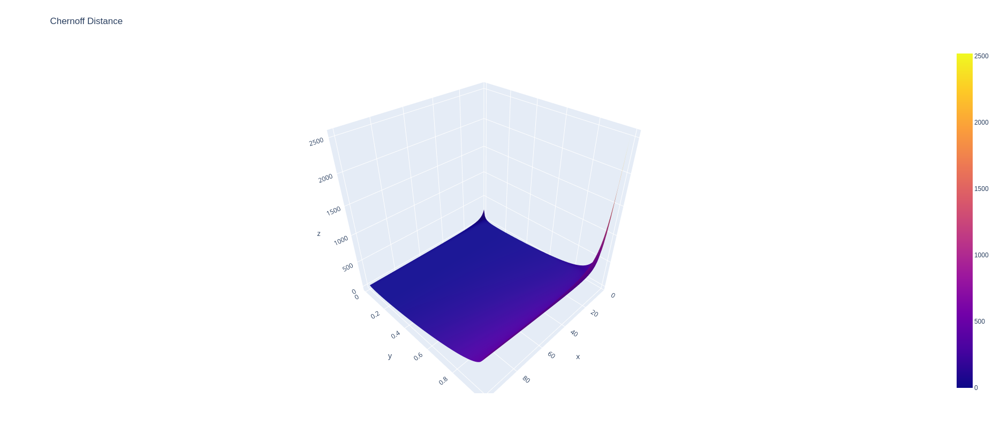

In [22]:
test_point = [0.1, 81]

zvals5 = np.zeros((len(mus), len(phis)))

test_alpha, test_beta, test_var, test_mode = beta_distr_params_from_mean_precision(*test_point)
for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        alpha, beta, var, mode = beta_distr_params_from_mean_precision(mu, phi)
        zvals5[i, j] = (beta_chernoff_distance(test_alpha, test_beta, alpha, beta, lbd=0.5).item() + 
                         beta_kl_divergence([alpha], [beta], [test_alpha], [test_beta]) + beta_kl_divergence([test_alpha], [test_beta], [alpha], [beta]) + 0.0005 * np.abs(phi)
        )


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals5, x=phis, y=mus)])
fig.update_layout(title='Chernoff Distance', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
# fig.update_layout(scene=dict(zaxis=dict(dtick=1, type='log')))
fig.show()

In [23]:
test_point = [0.1, 81]

zvals_f = np.zeros((len(mus), len(phis)))
zvals_b = np.zeros((len(mus), len(phis)))

test_alpha, test_beta, test_var, test_mode = beta_distr_params_from_mean_precision(*test_point)
for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        alpha, beta, var, mode = beta_distr_params_from_mean_precision(mu, phi)
        zvals_b[i, j] = beta_chernoff_distance(test_alpha, test_beta, alpha, beta, lbd=0.5).item() 
        zvals_f[i, j] = beta_chernoff_distance(alpha, beta, test_alpha, test_beta, lbd=0.5).item()
np.allclose(zvals_b - zvals_f, 0)

True

In [24]:
zvals_b

array([[ 1.59854256,  1.50541693,  1.44192907, ...,  2.31801396,
         2.32818375,  2.33829205],
       [ 1.26838717,  1.17398156,  1.10832672, ...,  1.53172331,
         1.53808292,  1.54440222],
       [ 1.08116609,  0.98595486,  0.91870499, ...,  1.03234788,
         1.03638223,  1.04039286],
       ...,
       [ 4.10883257,  4.91645974,  5.71690659, ..., 42.06363005,
        42.27086897, 42.4764313 ],
       [ 4.36006583,  5.18780748,  6.00855305, ..., 43.79616578,
        44.01522174, 44.23255773],
       [ 4.75425058,  5.60260042,  6.44424494, ..., 45.8594012 ,
        46.09255566, 46.32394748]])

In [25]:
zvals_f

array([[ 1.59854256,  1.50541693,  1.44192907, ...,  2.31801396,
         2.32818375,  2.33829205],
       [ 1.26838717,  1.17398156,  1.10832672, ...,  1.53172331,
         1.53808292,  1.54440222],
       [ 1.08116609,  0.98595486,  0.91870499, ...,  1.03234788,
         1.03638223,  1.04039286],
       ...,
       [ 4.10883257,  4.91645974,  5.71690659, ..., 42.06363005,
        42.27086897, 42.4764313 ],
       [ 4.36006583,  5.18780748,  6.00855305, ..., 43.79616578,
        44.01522174, 44.23255773],
       [ 4.75425058,  5.60260042,  6.44424494, ..., 45.8594012 ,
        46.09255566, 46.32394748]])

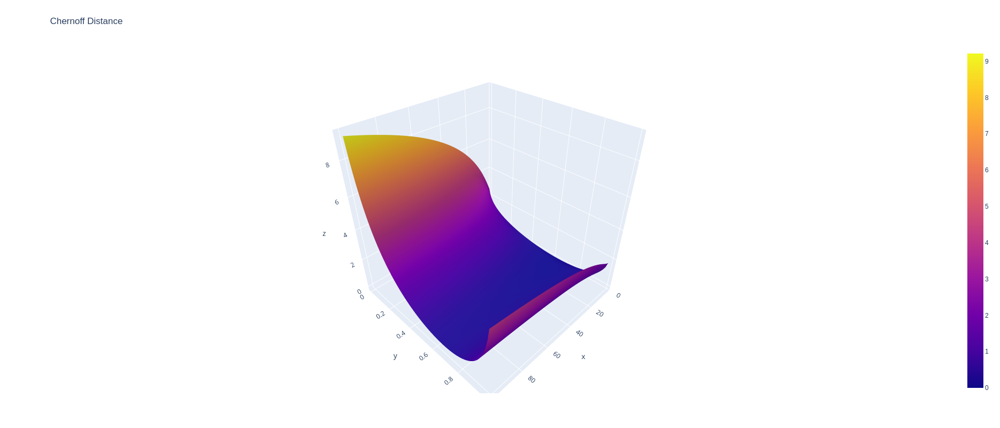

In [32]:
test_point = [0.65, 12]

zvals5 = np.zeros((len(mus), len(phis)))

test_alpha, test_beta, test_var, test_mode = beta_distr_params_from_mean_precision(*test_point)
for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        alpha, beta, var, mode = beta_distr_params_from_mean_precision(mu, phi)
        zvals5[i, j] = beta_chernoff_distance(test_alpha, test_beta, alpha, beta, lbd=0.5).item()# +  beta_chernoff_distance(alpha, beta, test_alpha, test_beta, lbd=0.5).item()


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals5, x=phis, y=mus)])
fig.update_layout(title='Chernoff Distance', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
# fig.update_layout(scene=dict(zaxis=dict(dtick=1, type='log')))
fig.show()

In [33]:
ixs = np.where(zvals5 == np.min(zvals5))
print(mus[ixs[0]])
print(phis[ixs[1]])

[0.65343434]
[11.81818182]


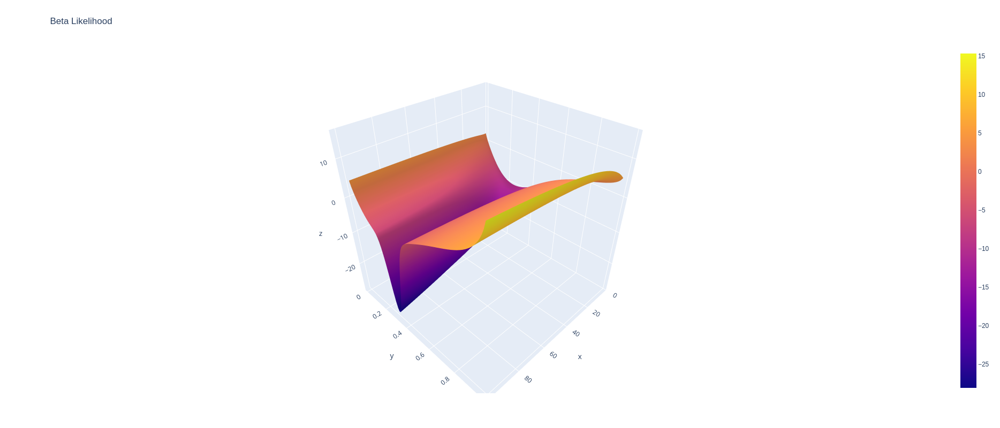

In [28]:
test_point = [0.3, 8]

zvals4 = np.zeros((len(mus), len(phis)))
test_alpha, test_beta, test_var, test_mode = beta_distr_params_from_mean_precision(*test_point)

for i, mu in enumerate(mus):
    for j, phi in enumerate(phis):
        alpha, beta, var, mode = beta_distr_params_from_mean_precision(mu, phi)
        zvals4[i, j] = (-2.61 * simmetrized_likelihood(test_point[0], test_point[1], mu, phi) 
                        + beta_chernoff_distance(test_alpha, test_beta, alpha, beta, lbd=0.5).item() +  
                        beta_chernoff_distance(alpha, beta, test_alpha, test_beta, lbd=0.5).item())


# Read data from a csv
# z_data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/api_docs/mt_bruno_elevation.csv')
# z = z_data.values
# sh_0, sh_1 = z.shape
# x, y = np.linspace(0, 1, sh_0), np.linspace(0, 1, sh_1)
fig = go.Figure(data=[go.Surface(z=zvals4, x=phis, y=mus)])
fig.update_layout(title='Beta Likelihood', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

In [29]:
def beta_standardized_residuals(alpha1, beta1, alpha2, beta2, lbd=0.5):
    assert lbd>0 and lbd<1
    if isinstance(alpha1, (int, float)):
        alpha1 = torch.tensor([alpha1])
    if isinstance(beta1, (int, float)):
        beta1 = torch.tensor([beta1])
    if isinstance(alpha2, (int, float)):
        alpha2 = torch.tensor([alpha2])
    if isinstance(beta2, (int, float)):
        beta2 = torch.tensor([beta2])
    
    
    if isinstance(alpha1, (list, np.ndarray)):
        alpha1 = torch.tensor(alpha1)
    if isinstance(beta1, (list, np.ndarray)):
        beta1 = torch.tensor(beta1)
    if isinstance(alpha2, (list, np.ndarray)):
        alpha2 = torch.tensor(alpha2)
    if isinstance(beta2, (list, np.ndarray)):
        beta2 = torch.tensor(beta2)
    
    
    assert (alpha1<0).sum()==0, "Invalid alpha1"
    assert (beta1<0).sum()==0, "Invalid beta1"
    assert (alpha2<0).sum()==0, "Invalid alpha2"
    assert (beta2<0).sum()==0, "Invalid beta2"

    jc = (torch.lgamma(lbd*alpha1+(1-lbd)*alpha2 + lbd*beta2+(1-lbd)*beta2)
          + lbd * (torch.lgamma(alpha1)+torch.lgamma(beta1)) 
          + (1-lbd) * (torch.lgamma(alpha2)+torch.lgamma(beta2))
          - torch.lgamma(lbd*alpha1 + (1-lbd)*alpha2) - torch.lgamma(lbd*beta1 + (1-lbd)*beta2)
          - lbd * torch.lgamma(alpha1+beta1)
          - (1-lbd) * torch.lgamma(alpha2 + beta2)
         )
    return jc

In [30]:
pred


100.0

In [31]:
beta_chernoff_distance(alpha, beta, test_alpha, test_beta, lbd=0.5)

tensor([7.6502], dtype=torch.float64)

In [35]:
alpha

99.0